# preprocess

In [ ]:
#@title upload image_process.py
%cd /content
from google.colab import files
uploaded = files.upload()
%mkdir /content/preprocess_test

/content


Saving image_process.py to image_process.py


In [ ]:
#@title mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<ipython-input-9-c3500f852f51>:50: UserWarning: /content/preprocess_test/canny_morph_sobel_canny_equ.jpg is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  io.imsave("/content/preprocess_test/canny_morph_sobel_canny_equ.jpg", canny_morph_sobel_canny_equ)


cuddly test
rr, cc [   0    0    0 ... 3048 3049 3050] [0 1 2 ... 0 0 0]
rr, cc shape 906035 906035
canny_morph_sobel_canny_equ shape (4776, 2704)


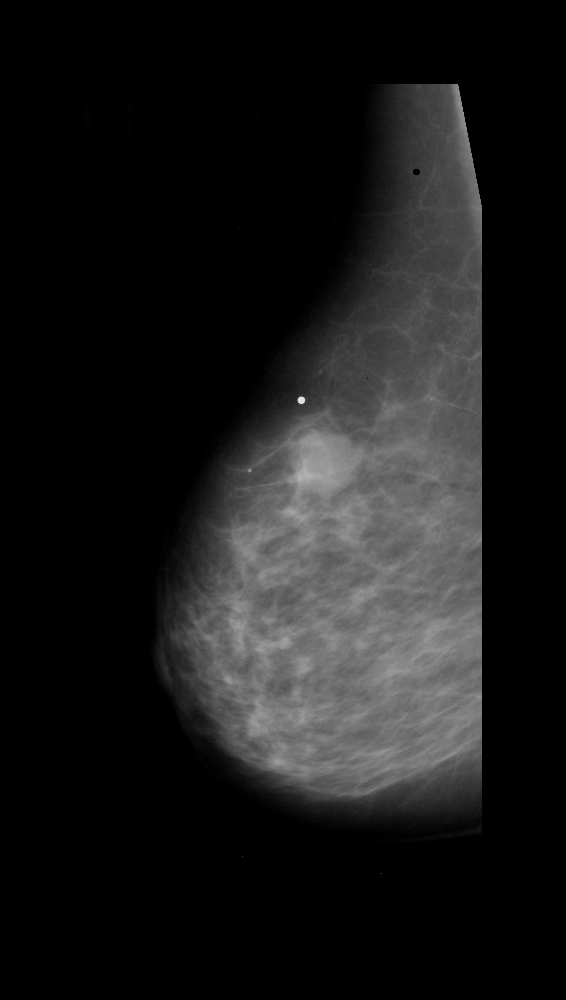

updating: preprocess_test/ (stored 0%)
updating: preprocess_test/artifact_thresh.jpg (deflated 27%)
updating: preprocess_test/artifact_mask.jpg (deflated 85%)
updating: preprocess_test/shortlistLines.jpg (deflated 34%)
updating: preprocess_test/canny_morph_sobel_canny_equ.jpg (deflated 19%)
updating: preprocess_test/lines.jpg (deflated 22%)
updating: preprocess_test/morph_sobel_canny_equ.jpg (deflated 12%)
updating: preprocess_test/border.jpg (deflated 28%)
updating: preprocess_test/artifact_result.jpg (deflated 6%)
updating: preprocess_test/artifact_morph.jpg (deflated 61%)
updating: preprocess_test/sobel_canny_equ.jpg (deflated 16%)
updating: preprocess_test/equ.jpg (deflated 4%)
updating: preprocess_test/pectoral.jpg (deflated 24%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

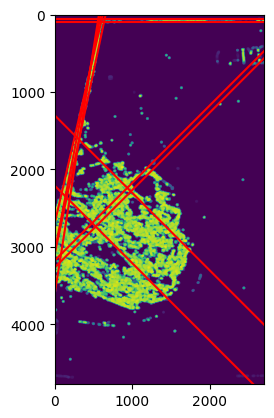

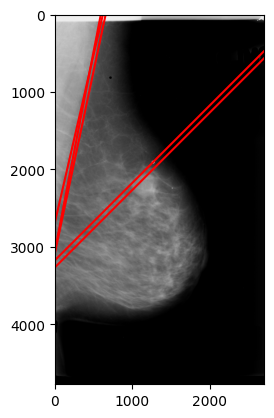

In [ ]:
#@title preprocess_experiment
# this file is for getting the experiment data
from image_process import *


#upload the test_data
'''
%cd /content
from google.colab import files
uploaded = files.upload()
'''


#this part is for remove artifact
image = cv2.imread("/content/test2_MLO.jpg")
gray = apply_cvtgray(image)
thresh = apply_thresh_otsu(gray)
morph = apply_morph(thresh)
mask = get_largest_area_mask(morph)
artifact = apply_mask(image, mask)

# save results
cv2.imwrite('/content/preprocess_test/artifact_thresh.jpg', thresh)
cv2.imwrite('/content/preprocess_test/artifact_morph.jpg', morph)
cv2.imwrite('/content/preprocess_test/artifact_mask.jpg', mask)
cv2.imwrite('/content/preprocess_test/artifact_result.jpg', artifact)


# get the test2_mammogram_equ_gray.jpg
removed_artifact = cv2.imread("/content/preprocess_test/artifact_result.jpg", 0)
equ = apply_equalizeHist(removed_artifact)
cv2.imwrite("/content/preprocess_test/equ.jpg", equ)

#get the canny_sigma1_sobel.jpg
equ = io.imread("/content/preprocess_test/equ.jpg")
orient_flag, equ = right_orient_mammogram(equ)
sobel_canny_equ = apply_canny_sobel(equ)
io.imsave("/content/preprocess_test/sobel_canny_equ.jpg", sobel_canny_equ)

#get the morph_sigma1.jpg
sobel_canny_equ = cv2.imread("/content/preprocess_test/sobel_canny_equ.jpg")
gray = apply_cvtgray(sobel_canny_equ)
morph_sobel_canny_equ = apply_morph(gray)
cv2.imwrite("/content/preprocess_test/morph_sobel_canny_equ.jpg", morph_sobel_canny_equ)


morph_sobel_canny_equ = io.imread("/content/preprocess_test/morph_sobel_canny_equ.jpg")
canny_morph_sobel_canny_equ = apply_canny(morph_sobel_canny_equ)
io.imsave("/content/preprocess_test/canny_morph_sobel_canny_equ.jpg", canny_morph_sobel_canny_equ)



lines = get_hough_lines(canny_morph_sobel_canny_equ)


pectoral = io.imread("/content/preprocess_test/artifact_result.jpg")
if (orient_flag == True):
  pectoral = apply_flip(pectoral)

fig1, ax1 = plt.subplots()
for line in lines:
  ax1.plot((line['point1'][0],line['point2'][0]), (line['point1'][1],line['point2'][1]), '-r')
ax1.imshow(morph_sobel_canny_equ)
fig1.savefig("/content/preprocess_test/lines.jpg")


shortlistLines = get_shortlist_lines(lines)
fig2, ax2 = plt.subplots()
for line in shortlistLines:
  ax2.plot((line['point1'][0],line['point2'][0]), (line['point1'][1],line['point2'][1]), '-r')
ax2.imshow(pectoral)
fig2.savefig("/content/preprocess_test/shortlistLines.jpg")

#Lucky! We get pectoral line
if( len(shortlistLines)!= 0):
  rr, cc = get_pectoral_mask(shortlistLines, pectoral)
  print("cuddly test")
  print("rr, cc", rr, cc)
  print("rr, cc shape", len(rr), len(cc))
  print("canny_morph_sobel_canny_equ shape", canny_morph_sobel_canny_equ.shape)
  plt.imshow(pectoral)
  pectoral[rr, cc] = 0


if( orient_flag == True ):
  pectoral = apply_flip(pectoral)
io.imsave("/content/preprocess_test/pectoral.jpg", pectoral)

border = cv2.imread("/content/preprocess_test/pectoral.jpg")
border = add_border(border, width = 400)
cv2_imshow(border)
cv2.imwrite("/content/preprocess_test/border.jpg", border)


#download the experiment result
from google.colab import files
!zip -r preprocess_test.zip preprocess_test/
files.download('/content/preprocess_test.zip')

#clean the preprocess_test files
#!cd /content/preprocess_test
#!rm /content/preprocess_test/*.jpg


 #@title border test
from image_process import *
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread("/content/pectoral.jpg")
image = add_border(image, width = 140)
cv2_imshow(image)
cv2.imwrite("/content/border.jpg", image)

In [ ]:
#@title preprocess_main
# this file is for getting the clean data
from image_process import *
from google.colab.patches import cv2_imshow
import skimage
import os


#remove_artifact: remove the artifact
#input: filename(full path), src_dir, dst_dir
#ouput: None
def remove_artifact(filename, src_dir, dst_dir):
  image = cv2.imread(filename)
  gray = apply_cvtgray(image)
  thresh = apply_thresh_otsu(gray)
  morph = apply_morph(thresh)
  mask = get_largest_area_mask(morph)
  artifact = apply_mask(image, mask)
  cv2.imwrite(os.path.join(dst_dir, 'artifact.jpg'), artifact)

#get_better_canny: this function is to get better edge detection for getting hough lines
# input: removed_artifact: the removed_artifact gray picture
def get_better_canny(removed_artifact, dst_dir):
  equ = apply_equalizeHist(removed_artifact)
  cv2.imwrite(os.path.join(dst_dir, "equ.jpg"), equ)
  equ = io.imread(os.path.join(dst_dir, "equ.jpg"))
  orient_flag, equ = right_orient_mammogram(equ)
  sobel_canny_equ = apply_canny_sobel(equ)
  io.imsave(os.path.join(dst_dir, "sobel_canny_equ.jpg"), sobel_canny_equ)
  sobel_canny_equ = cv2.imread(os.path.join(dst_dir, "sobel_canny_equ.jpg"))
  gray = apply_cvtgray(sobel_canny_equ)
  morph_sobel_canny_equ = apply_morph(gray)
  cv2.imwrite(os.path.join(dst_dir, "morph_sobel_canny_equ.jpg"), morph_sobel_canny_equ)
  morph_sobel_canny_equ = io.imread(os.path.join(dst_dir, "morph_sobel_canny_equ.jpg"))
  canny_morph_sobel_canny_equ = apply_canny(morph_sobel_canny_equ)
  return canny_morph_sobel_canny_equ, orient_flag

def mask_pectoral(canny_morph_sobel_canny_equ, orient_flag, dst_dir):
  lines = get_hough_lines(canny_morph_sobel_canny_equ)
  pectoral = io.imread(os.path.join(dst_dir, "artifact.jpg"))
  #condition 1: Terrible! No straight lines is detected!
  if( len(lines)== 0):
    io.imsave(os.path.join(dst_dir, "pectoral.jpg"), pectoral)
    return
  if (orient_flag == True):
    pectoral = apply_flip(pectoral)
  shortlistLines = get_shortlist_lines(lines)
  #condition 2: Lucky! There exist shortlistLines
  if( len(shortlistLines) != 0 ):
    rr, cc = get_pectoral_mask(shortlistLines, pectoral)
    plt.imshow(pectoral)
    pectoral[rr, cc] = 0
  if( orient_flag == True ):
    pectoral = apply_flip(pectoral)
  io.imsave(os.path.join(dst_dir, "pectoral.jpg"), pectoral)

def add_border_denoise(filename, width = 400):
  border = cv2.imread(filename)
  border = add_border(border, width = 400)
  cv2.imwrite(filename, border)

def remove_pectoral(dst_dir):
  removed_artifact = cv2.imread(os.path.join(dst_dir, "artifact.jpg"), 0)
  canny_morph_sobel_canny_equ, orient_flag = get_better_canny(removed_artifact, dst_dir)
  mask_pectoral(canny_morph_sobel_canny_equ, orient_flag, dst_dir)


#preprocess_cc_file: preprocessing the CC image
#input: dst_dir, file_name(full path)
#output: None
def preprocess_cc_file(filename, src_dir, dst_dir):
  remove_artifact(filename, src_dir, dst_dir)
  basename = os.path.basename(filename)
  os.rename(os.path.join(dst_dir, 'artifact.jpg'), os.path.join(dst_dir, basename))
  add_border_denoise(os.path.join(dst_dir, basename))

def preprocess_mlo_file(filename, src_dir, dst_dir):
  remove_artifact(filename, src_dir, dst_dir)
  remove_pectoral(dst_dir)
  basename = os.path.basename(filename)
  os.rename(os.path.join(dst_dir, 'pectoral.jpg'), os.path.join(dst_dir, basename))
  add_border_denoise(os.path.join(dst_dir, basename))

#clean_temp_files: deleting all temp files including equ.jpg, morph_sobel_canny_equ.jpg, sobel_canny_equ.jpg
#input: dst_dir
def clean_temp_files(dst_dir):
  os.remove(os.path.join(dst_dir, "equ.jpg"))
  os.remove(os.path.join(dst_dir, "morph_sobel_canny_equ.jpg"))
  os.remove(os.path.join(dst_dir, "sobel_canny_equ.jpg"))


import glob
import os

show_step = 5

# read all jpg file
root_dir = '/content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM/mass_train'
src_dir = os.path.join(root_dir, 'mass_train')
images_list =  glob.glob(os.path.join(src_dir, '*.jpg'))

# make dst_src
dst_dir = os.path.join(root_dir, 'clean_mass_train')
if not os.path.exists(dst_dir):
    os.makedirs(dst_dir)

#begin to preprocess
file_cnt = 0
for filename in images_list:
  if( filename[-5]=='O' ):
    preprocess_mlo_file(filename, src_dir, dst_dir)
  if( filename[-5]=='C' ):
    preprocess_cc_file(filename, src_dir, dst_dir)
  file_cnt += 1
  if( file_cnt % show_step == 0):
    print("The amount of files processed is {}/{}".format(file_cnt, len(images_list)))
clean_temp_files(dst_dir)
print('The amount of files processed is ', file_cnt)


'''
problem:
1, opencv_to_scikit, scikit_to_opencv will make image lose precision, which results the inaccuracy.
But many writing and reading increases the preprocessing time.

procedure of single picture:

'''

<ipython-input-3-fe416920acc3>:29: UserWarning: /content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM/mass_train/clean_mass_train/sobel_canny_equ.jpg is a low contrast image
  io.imsave(os.path.join(dst_dir, "sobel_canny_equ.jpg"), sobel_canny_equ)


The amount of files processed is 5/1230


KeyboardInterrupt: ignored

In [ ]:
#@title remove clean_mass_train for test
#make dst_src
#root_dir = '/content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM/mass_train'
import shutil

shutil.rmtree('/content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM/mass_train/clean_mass_train')


# train

In [ ]:
#@title install detectron2 dependencies
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

In [ ]:
#@title Install detectron2
%cd /content/
# install detectron2:
!git clone https://github.com/facebookresearch/detectron2
%cd /content
'''
!pip install -r requirements.txt
!python setup.py install
!pip install git+https://github.com/facebookresearch/fvcore.git
'''
!python -m pip install -e detectron2


/content
fatal: destination path 'detectron2' already exists and is not an empty directory.
/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 KB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 16.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 14.1 MB/s eta 0:00:00
  Created wheel for fvc

In [ ]:
#@title restart the runtime
#before import
import os
os.kill(os.getpid(), 9)

[01/19 02:49:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[01/19 02:49:32 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:08, 19.9MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/19 02:49:43 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/19 02:50:22 d2.utils.events]:  eta: 0:28:15  iter: 19  total_loss: 1.407  loss_cls: 0.4976  loss_box_reg: 0.07477  loss_mask: 0.6922  loss_rpn_cls: 0.155  loss_rpn_loc: 0.008925  time: 0.8569  data_time: 1.0195  lr: 4.9953e-06  max_mem: 2759M
[01/19 02:50:42 d2.utils.events]:  eta: 0:27:58  iter: 39  total_loss: 1.319  loss_cls: 0.421  loss_box_reg: 0.07469  loss_mask: 0.6894  loss_rpn_cls: 0.1223  loss_rpn_loc: 0.006805  time: 0.9325  data_time: 0.5227  lr: 9.9902e-06  max_mem: 2759M
[01/19 02:51:01 d2.utils.events]:  eta: 0:24:17  iter: 59  total_loss: 1.299  loss_cls: 0.3352  loss_box_reg: 0.1303  loss_mask: 0.682  loss_rpn_cls: 0.1038  loss_rpn_loc: 0.007129  time: 0.9263  data_time: 0.3985  lr: 1.4985e-05  max_mem: 2759M
[01/19 02:51:23 d2.utils.events]:  eta: 0:24:39  iter: 79  total_loss: 1.111  loss_cls: 0.2215  loss_box_reg: 0.05889  loss_mask: 0.6671  loss_rpn_cls: 0.126  loss_rpn_loc: 0.006976  time: 0.9709  data_time: 0.5681  lr: 1.998e-05  max_mem: 2759M
[01/19 02:51:4

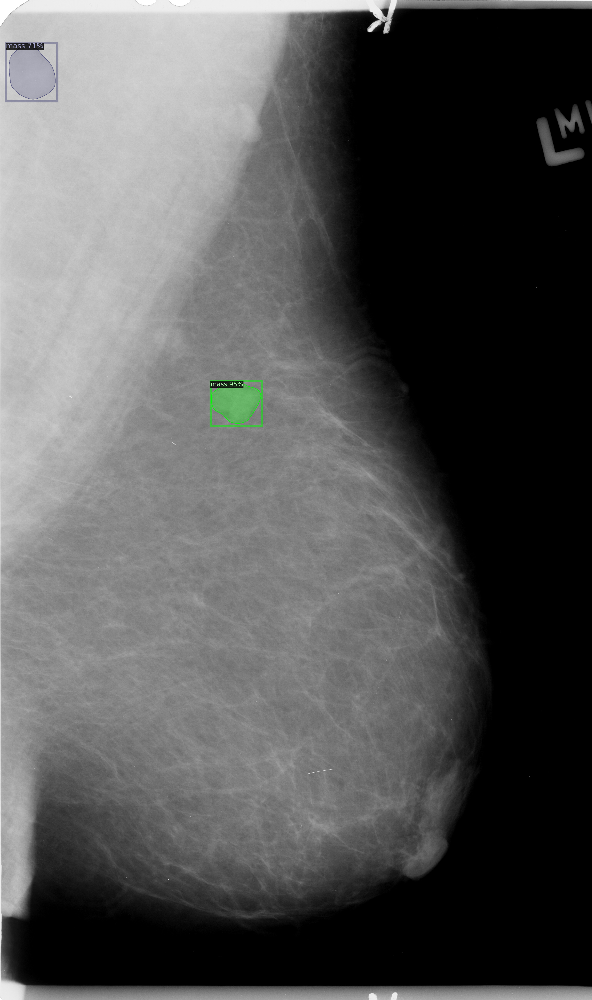

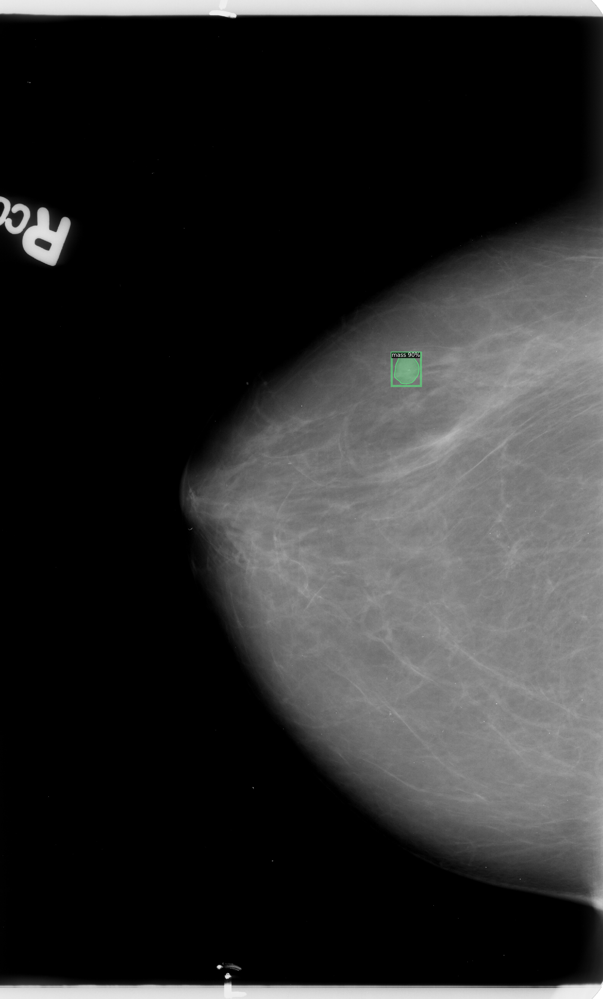

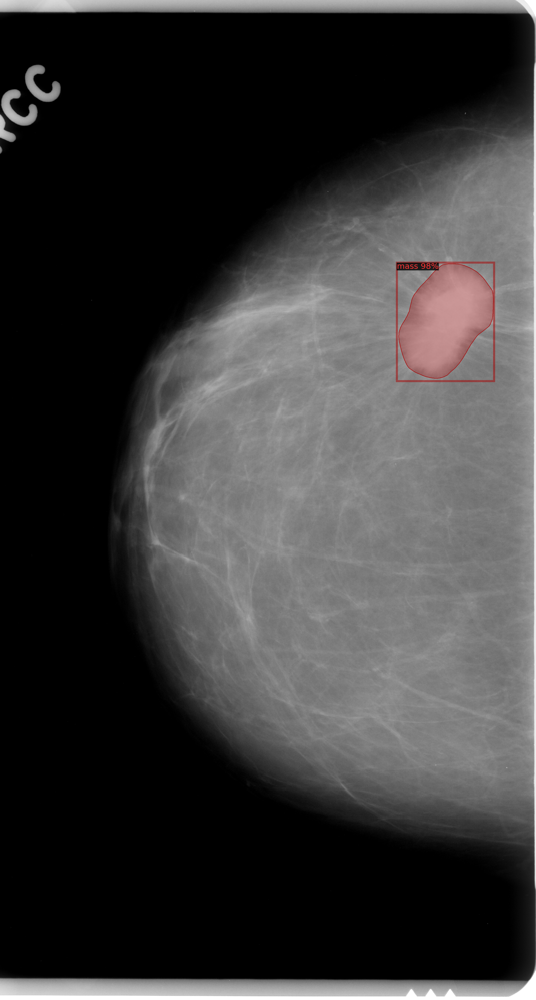

WARNING [01/19 03:20:40 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[01/19 03:20:40 d2.evaluation.coco_evaluation]: Trying to convert 'test' to COCO format ...
[01/19 03:20:40 d2.data.datasets.coco]: Converting annotations of dataset 'test' to COCO format ...)
test in utils len(images_data) 361
test in utils len(annotations) 378
[01/19 03:20:40 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[01/19 03:20:40 d2.data.datasets.coco]: Conversion finished, #images: 361, #annotations: 378
[01/19 03:20:40 d2.data.datasets.coco]: Caching COCO format annotations at './output/test_coco_format.json' ...
test in utils len(images_data) 361
test in utils len(annotations) 378
[01/19 03:20:40 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    mass    | 378          |
|            |              |
[01/19 0

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[01/19 03:20:49 d2.evaluation.evaluator]: Inference done 11/361. Dataloading: 0.1311 s/iter. Inference: 0.1265 s/iter. Eval: 0.2732 s/iter. Total: 0.5308 s/iter. ETA=0:03:05
[01/19 03:20:54 d2.evaluation.evaluator]: Inference done 17/361. Dataloading: 0.1707 s/iter. Inference: 0.1458 s/iter. Eval: 0.3929 s/iter. Total: 0.7100 s/iter. ETA=0:04:04
[01/19 03:20:59 d2.evaluation.evaluator]: Inference done 26/361. Dataloading: 0.1668 s/iter. Inference: 0.1443 s/iter. Eval: 0.3417 s/iter. Total: 0.6535 s/iter. ETA=0:03:38
[01/19 03:21:05 d2.evaluation.evaluator]: Inference done 38/361. Dataloading: 0.1517 s/iter. Inference: 0.1413 s/iter. Eval: 0.2906 s/iter. Total: 0.5842 s/iter. ETA=0:03:08
[01/19 03:21:10 d2.evaluation.evaluator]: Inference done 46/361. Dataloading: 0.1313 s/iter. Inference: 0.1451 s/iter. Eval: 0.3176 s/iter. Total: 0.5946 s/iter. ETA=0:03:07
[01/19 03:21:15 d2.evaluation.evaluator]: Inference done 54/361. Dataloading: 0.1111 s/iter. Inference: 0.1453 s/iter. Eval: 0.346

In [ ]:
#@title mask_rcnn
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

from utils import get_datasets
from detectron2.data import DatasetCatalog, MetadataCatalog

nums_data = None #set the num of dataset, None means all

dataset_path = "/content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM"


DatasetCatalog.clear()
for d in ["train", "test"]:
    DatasetCatalog.register(d, lambda d = d: get_datasets(nums_data, dataset_path, d))
    MetadataCatalog.get(d).set(thing_classes=["mass"])
    
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import torch
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')   # train on the GPU or on the CPU, if a GPU is not available

cfg = get_cfg()
cfg.merge_from_file("/content/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 4 #originally 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
#cfg.SOLVER.STEPS = 1 #by cuddly
cfg.SOLVER.MAX_ITER = 2000   # 50 5 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   #50 5 128  faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)
#cfg.MODEL.DEVICE = "cpu"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

print(cfg.dump())  
with open("./output/custom_mask_rcnn_X_101_32x8d_FPN_3x_my_dataset1.yaml", "w") as f:
    f.write(cfg.dump())


from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultPredictor
import random
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer, ColorMode


# load weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
# Set training data-set path
cfg.DATASETS.TEST = ("test", )
# Create predictor (model for inference)
predictor = DefaultPredictor(cfg)

dataset_dicts = get_datasets(nums_data, dataset_path, d)
test_metadata = MetadataCatalog.get("test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    #cv2.imshow(v.get_image()[:, :, ::-1])

from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/", use_fast_impl=False) #originally my_dataset_test
val_loader = build_detection_test_loader(cfg, "test") #originally my_dataset_test
print(inference_on_dataset(predictor.model, val_loader, evaluator))

In [ ]:
#@title evaluate
#import the COCO Evaluator to use the COCO Metrics
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultTrainer
import os
import json
from detectron2.structures import BoxMode
from utils import get_datasets
from detectron2.data import DatasetCatalog, MetadataCatalog

nums_data = 200

dataset_path = "/content/drive/MyDrive/graduation_project/dataset/CBIS_DDSM"
DatasetCatalog.clear()
for d in ["train"]:
    DatasetCatalog.register("train", lambda d = d: get_datasets(nums_data, dataset_path, d))
    MetadataCatalog.get("train").set(thing_classes=["mass"])

cfg = get_cfg()
cfg.merge_from_file("./output/custom_mask_rcnn_X_101_32x8d_FPN_3x_my_dataset1.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  #originally 0.5 set threshold for this model
cfg.MODEL.WEIGHTS = "./output/model_final.pth"
#cfg.MODEL.DEVICE = "cpu"

predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultPredictor
import random
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer, ColorMode

dataset_dicts = get_datasets(nums_data, dataset_path, "test")
breast_metadata = MetadataCatalog.get("test")

for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=breast_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    #cv2.imshow(v.get_image()[:, :, ::-1])


evaluator = COCOEvaluator("train", cfg, False, output_dir="./output/") #originally my_dataset_test
val_loader = build_detection_test_loader(cfg, "train") #originally my_dataset_test

print(inference_on_dataset(predictor.model, val_loader, evaluator))


In [ ]:
#@title clear the dir
%cd /content
%rm -r output


/content
rm: cannot remove 'output': No such file or directory


In [ ]:
#!find / -name cocoeval.py
%cd /usr/local/lib/python3.8/dist-packages/pycocotools
%rm cocoeval.py
from google.colab import files
uploaded = files.upload()
#@title upload cocoeval to calculate FPN
#import sys
#print(sys.executable)

/usr/local/lib/python3.8/dist-packages/pycocotools


Saving cocoeval.py to cocoeval.py


In [ ]:
#@title balloon dataset train
from utils import get_balloon_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog

DatasetCatalog.clear()
for d in ["train", "val"]:
    DatasetCatalog.register("balloon/" + d, lambda d=d: get_balloon_dicts("/content/drive/MyDrive/graduation_project/dataset/balloon/" + d))
    MetadataCatalog.get("balloon/" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon/train")

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("/content/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("balloon/train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   #128 faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)
#cfg.MODEL.DEVICE = "cpu"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()




#try to use predictor
from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultPredictor
import random
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer, ColorMode

# load weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
# Set training data-set path
cfg.DATASETS.TEST = ("balloon/val", )
# Create predictor (model for inference)
predictor = DefaultPredictor(cfg)

dataset_dicts = get_balloon_dicts("/content/drive/MyDrive/graduation_project/dataset/balloon/val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    #cv2.imshow(v.get_image()[:, :, ::-1])




#evalute the data
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
evaluator = COCOEvaluator("balloon/val", cfg, False, output_dir="./output/") #originally my_dataset_test
val_loader = build_detection_test_loader(cfg, "balloon/val") #originally my_dataset_test
print(inference_on_dataset(predictor.model, val_loader, evaluator))